# Airline transportation Network Analysis

In [1]:
# importing python libraries needed for the data analysis
import pandas as pd
import networkx as nx
from cartopy import crs as ccrs, feature as cfeature
import matplotlib.pyplot as plt
import warnings 

#  Suppress warnings issued by Cartopy when downloading data files
warnings.filterwarnings('ignore')

# <p style="text-align: center;">Part 1. Data preparation and visualization</p>

## <p style="color:green; text-align: center;">Year of 2014</p>

### *Data preparation*

Let's start from reading csv file that stores flights held on 28.06.2014 as pandas dataframe 'df_flights_2014'.

In [2]:
df_flights_2014 = pd.read_csv('routes_2014.tsv', sep='\t')
df_flights_2014.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72406 entries, 0 to 72405
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   airline    72406 non-null  object
 1   from       72406 non-null  object
 2   to         72406 non-null  object
 3   codeshare  19209 non-null  object
 4   stops      72406 non-null  int64 
 5   equipment  72388 non-null  object
dtypes: int64(1), object(5)
memory usage: 3.3+ MB


The dataframe consists of 6 columns (airline, from, to, codeshare, stops, equipment) and 72 406 rows that correspond to 72 405 flights occured on 28.06.2014 all over the world. 

*********

Let's select only relevant for the further analysis information.

Columns:
 - 'from' (iata code of the airports where the flights started)
 - 'to' (iata code of the airports where the flights ended)
 
Rows:
Only those rows where either 'from' airport or 'to' airport is the Russian one.
 
 

In [3]:
# filtering the columns
df_flights_2014 = df_flights_2014[['from', 'to']]

# filtering the rows
df2_airports = pd.read_csv('russian_airports.csv', header=None) # reading the csv file with the list of russian airports
df2_airports = df2_airports[0].to_list()
df_flights_2014 = df_flights_2014[df_flights_2014['from'].isin(df2_airports) | df_flights_2014['to'].isin(df2_airports)]
df_flights_2014.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2592 entries, 0 to 72403
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   from    2592 non-null   object
 1   to      2592 non-null   object
dtypes: object(2)
memory usage: 60.8+ KB


We now have the dataframe 'df_flights_2014' representing 2 592 flights from or to Russia on 28.06.2014.


### *Network visualization*

The next step is data visualization. We create <span style="color:green">*an undirected single-edge graph 'graph_2014'*</span> representing the network of flights, where: the nodes - airports, the edges - flight connections. An edge is drawn between two airports only if there was at least one flight between those airports on the 28.06.2014.

In [4]:
edges_2014 = df_flights_2014.values
graph_2014 = nx.from_edgelist(edges_2014)

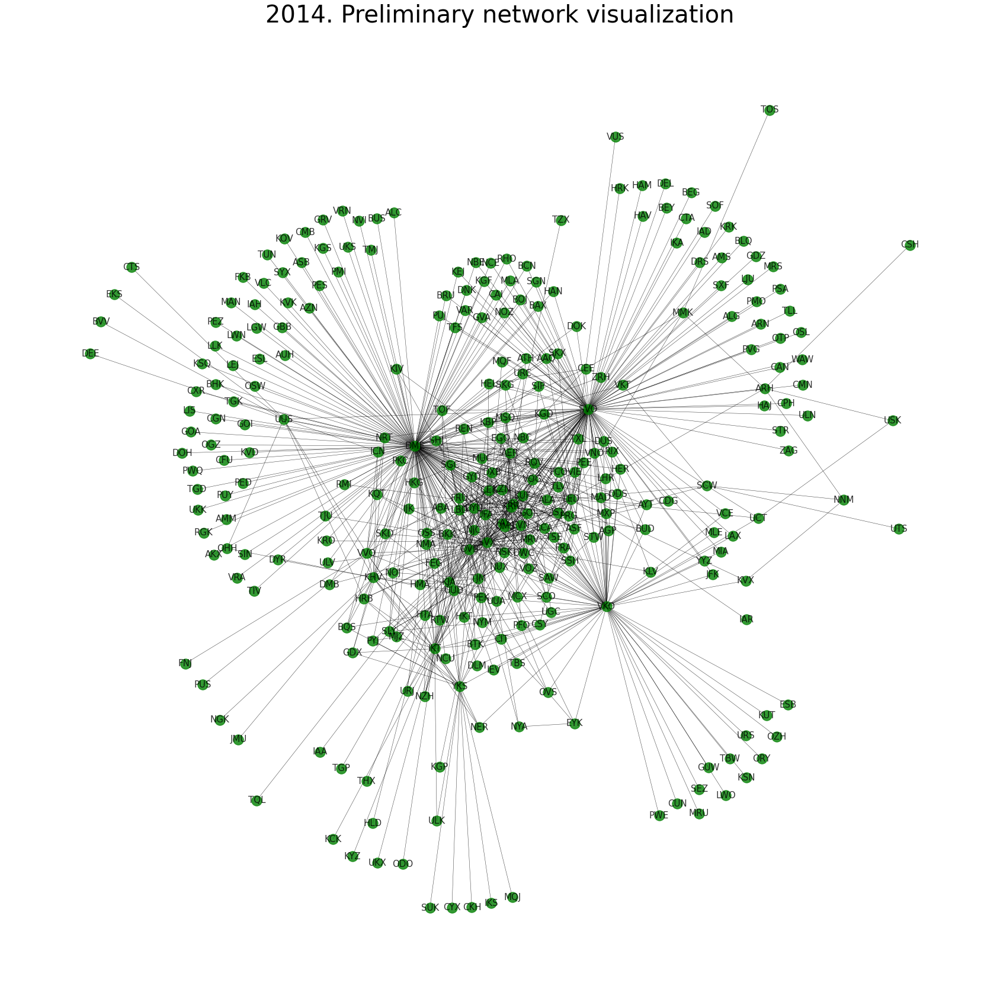

In [5]:
# preliminary network 2014 visualization 
fig, ax = plt.subplots(1, 1, figsize=(30, 30), facecolor='w')
ax.set_title('2014. Preliminary network visualization', fontsize=40)
nx.draw_networkx(graph_2014, ax=ax,
                 font_size=15, 
                 node_color='green',
                 alpha=.8,
                 width=.5)
ax.set_axis_off()

**For better visual representation of the network, we now put it on a geographic map using cartopy library.**

In [6]:
# the node sizes will depend on the degree of the nodes, that is, the number of connections to each node
deg_2014 = nx.degree(graph_2014)
sizes_2014 = [5 * deg_2014[iata] for iata in graph_2014.nodes]

# the labels will be displayed for the largest airports only (at least 10 connections to other airports):
labels_2014 = {iata: iata if deg_2014[iata] >= 10 else ''
          for iata in graph_2014.nodes}

In [7]:
# reding a csv file with world airports' coordinates and storing them in 'df_airports_coordinates' dataframe
df_airports_coordinates = pd.read_csv('airports_coordinates.csv')
df_airports_coordinates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8868 entries, 0 to 8867
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8868 non-null   object 
 1   latitude_deg   8868 non-null   float64
 2   longitude_deg  8868 non-null   float64
 3   iso_country    8837 non-null   object 
 4   iso_region     8868 non-null   object 
 5   iata_code      8868 non-null   object 
dtypes: float64(2), object(4)
memory usage: 415.8+ KB


In [8]:
# preparing the dictionary of airports coordinates

coordinates_dict_2014 = dict()

for node in graph_2014.nodes:
    for i in range(len(df_airports_coordinates)):
        if node == df_airports_coordinates['iata_code'][i]:
            coordinates_dict_2014[node]=(df_airports_coordinates['longitude_deg'][i], df_airports_coordinates['latitude_deg'][i])

# adding coordinates of the airports that were missing in the initial dataframe but needed for the analysis
coordinates_dict_2014['RTW'] = (46,51)
coordinates_dict_2014['TXL'] = (13,52)
coordinates_dict_2014['TSE'] = (71,51)
coordinates_dict_2014['DOK'] = (37,48)
coordinates_dict_2014['SXF'] = (13,52)            
            
coordinates_dict_2014

{'AER': (39.9566, 43.449902),
 'KZN': (49.27870178, 55.60620117),
 'ASF': (48.010511, 46.282843),
 'MRV': (43.08190155, 44.22510147),
 'CEK': (61.5033, 55.305801),
 'OVB': (82.618675, 55.019756),
 'DME': (37.90629959, 55.40879822),
 'NBC': (52.09249878, 55.56470108),
 'TGK': (38.8491667, 47.1983333),
 'UUA': (52.80170059, 54.63999939),
 'EGO': (36.59009933, 50.64379883),
 'KGD': (20.59259987, 54.88999939),
 'GYD': (50.04669952, 40.46749878),
 'LED': (30.26250076, 59.8003006),
 'SVX': (60.80270004, 56.74309921),
 'NJC': (76.4835968, 60.94929886),
 'NUX': (76.52030182, 66.06939697),
 'BTK': (101.697998, 56.37060165),
 'IKT': (104.389, 52.268002),
 'HTA': (113.306, 52.026299),
 'KCK': (108.064, 57.773),
 'ODO': (114.2429962, 57.86610031),
 'UKX': (105.7300034, 56.8567009),
 'ULK': (114.8259964, 60.72060013),
 'YKS': (129.7709961, 62.09329987),
 'MJZ': (114.0390015, 62.53469849),
 'BHK': (64.483299, 39.775002),
 'FEG': (71.745003, 40.358799),
 'KSQ': (65.773068, 38.802246),
 'NMA': (71.556

In [9]:
# adding attribute 'country' to the nodes

for i, v in df_airports_coordinates.iterrows():    
    for p in list(graph_2014.nodes()):
        if p == v['iata_code']:
            graph_2014.nodes[p]['country'] = v['iso_country']

graph_2014.nodes['RTW']['country'] = 'RU'
graph_2014.nodes['TXL']['country'] = 'DE'
graph_2014.nodes['TSE']['country'] = 'KZ'
graph_2014.nodes['DOK']['country'] = 'UA'
graph_2014.nodes['SXF']['country'] = 'DE'


In [10]:
#creating color map
color_map = []
for node in graph_2014.nodes():
    if graph_2014.nodes[node]['country'] == 'RU':
        color_map.append('green')
    else: 
        color_map.append('grey')   

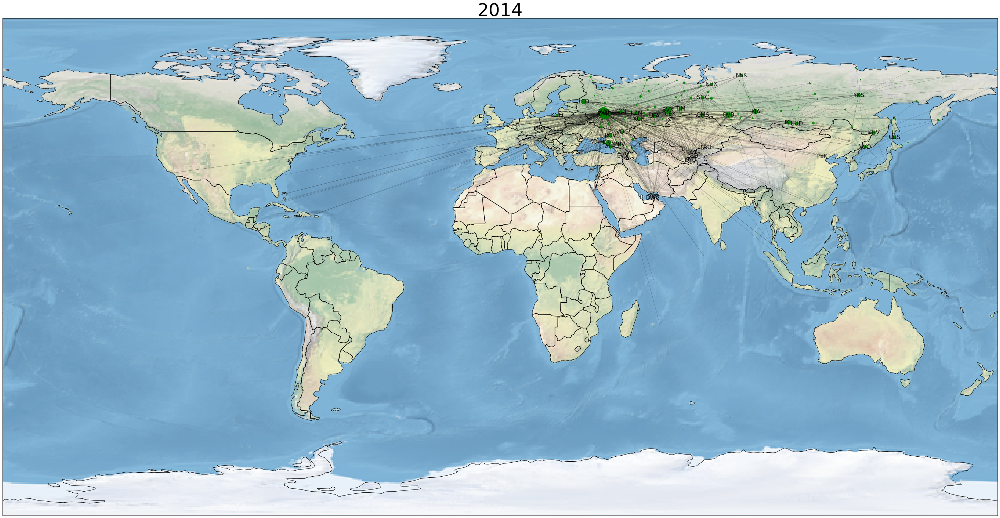

In [11]:
# using cartopy library to project the nodes on the geographic map:

# map projection
crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    1, 1, figsize=(50, 50), facecolor='w',
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_title('2014', fontsize=50)
ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black')
ax.stock_img()

# network projection
nx.draw_networkx(graph_2014, ax=ax,
                 font_size=16,
                 alpha=.9,
                 width=.2,
                 node_size=sizes_2014,
                 node_color=color_map,
                 labels=labels_2014,
                 pos=coordinates_dict_2014,
                 )

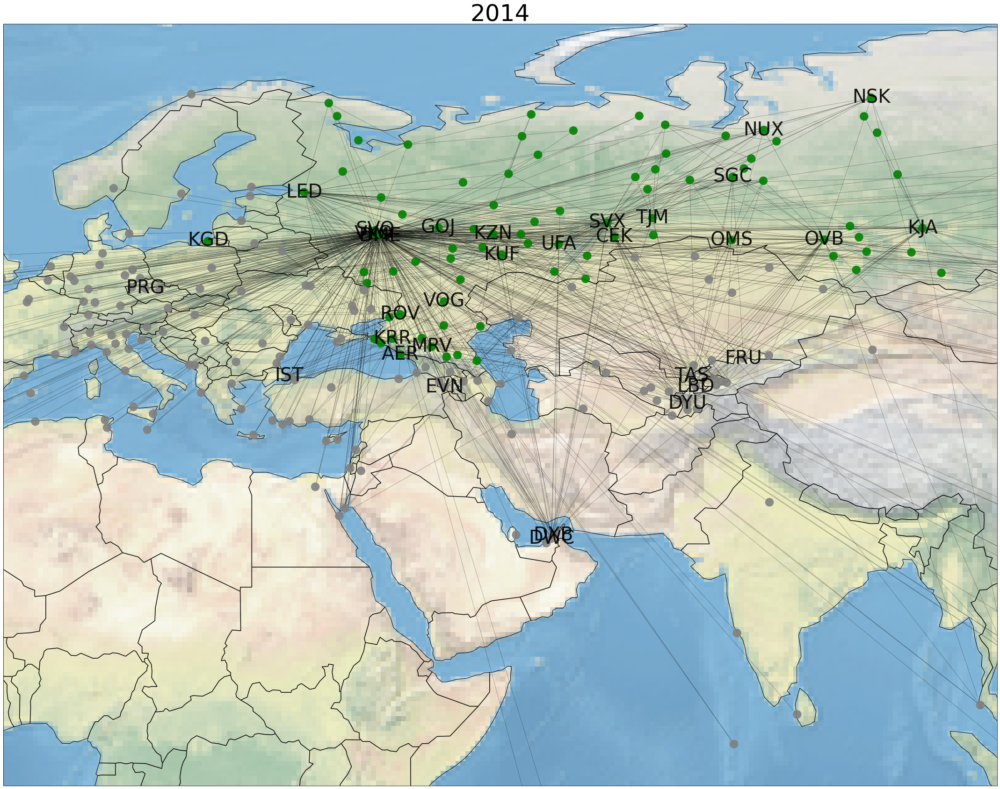

In [12]:
# zooming the map

crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    1, 1, figsize=(50, 30), facecolor='w',
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_title('2014', fontsize=50)
ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black')
#ax.set_extent([lonW, lonE, latS, latN])
ax.set_extent([100, 0, 0, 70])
ax.stock_img()

nx.draw_networkx(graph_2014, ax=ax,
                 font_size=40,
                 alpha=.9,
                 width=.3,
                 #node_size=sizes_2014,
                 node_color=color_map,
                 labels=labels_2014,
                 pos=coordinates_dict_2014,
                 )

## <p style="color:coral; text-align: center;">Year of 2022</p>

### *Data preparation*

Let's start from reading csv file that stores flights held on 31.10.2022 as pandas dataframe 'df_flights_2022'.

In [13]:
df_flights_2022 = pd.read_csv('routes_2022.tsv', sep='\t')
df_flights_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32706 entries, 0 to 32705
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   # airline  32694 non-null  object
 1   from       32706 non-null  object
 2   to         32706 non-null  object
 3   codeshare  2740 non-null   object
 4   stops      32706 non-null  int64 
 5   equipment  32706 non-null  object
dtypes: int64(1), object(5)
memory usage: 1.5+ MB


The dataframe consists of 6 columns (airline, from, to, codeshare, stops, equipment) and 32 679 rows that correspond to 32 678 flights occured on 31.10.2022 all over the world.

*******

Let's select only relevant for the further analysis information.

Columns:

- 'from' (iata code of the airports where the flights started)
- 'to' (iata code of the airports where the flights ended)

Rows: Only those rows where either 'from' airport or 'to' airport is the Russian one.

In [14]:
# filtering the rows
df_flights_2022 = df_flights_2022[['from', 'to']]

# filtering the columns
df_flights_2022 = df_flights_2022[df_flights_2022['from'].isin(df2_airports) | df_flights_2022['to'].isin(df2_airports)]
df_flights_2022.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1092 entries, 76 to 32086
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   from    1092 non-null   object
 1   to      1092 non-null   object
dtypes: object(2)
memory usage: 25.6+ KB


We now have the dataframe 'df_flights_2022' representing 1 144 flights from or to Russia on 31.10.2022.

### *Network visualization*

The next step is data visualization. We create <span style="color:coral">*an undirected single-edge graph 'graph_2022'*</span> representing the network of flights, where: the nodes - airports, the edges - flight connections. An edge is drawn between two airports only if there was at least one flight between those airports on the 31.10.2022.

In [15]:
edges_2022 = df_flights_2022.values
graph_2022 = nx.from_edgelist(edges_2022)

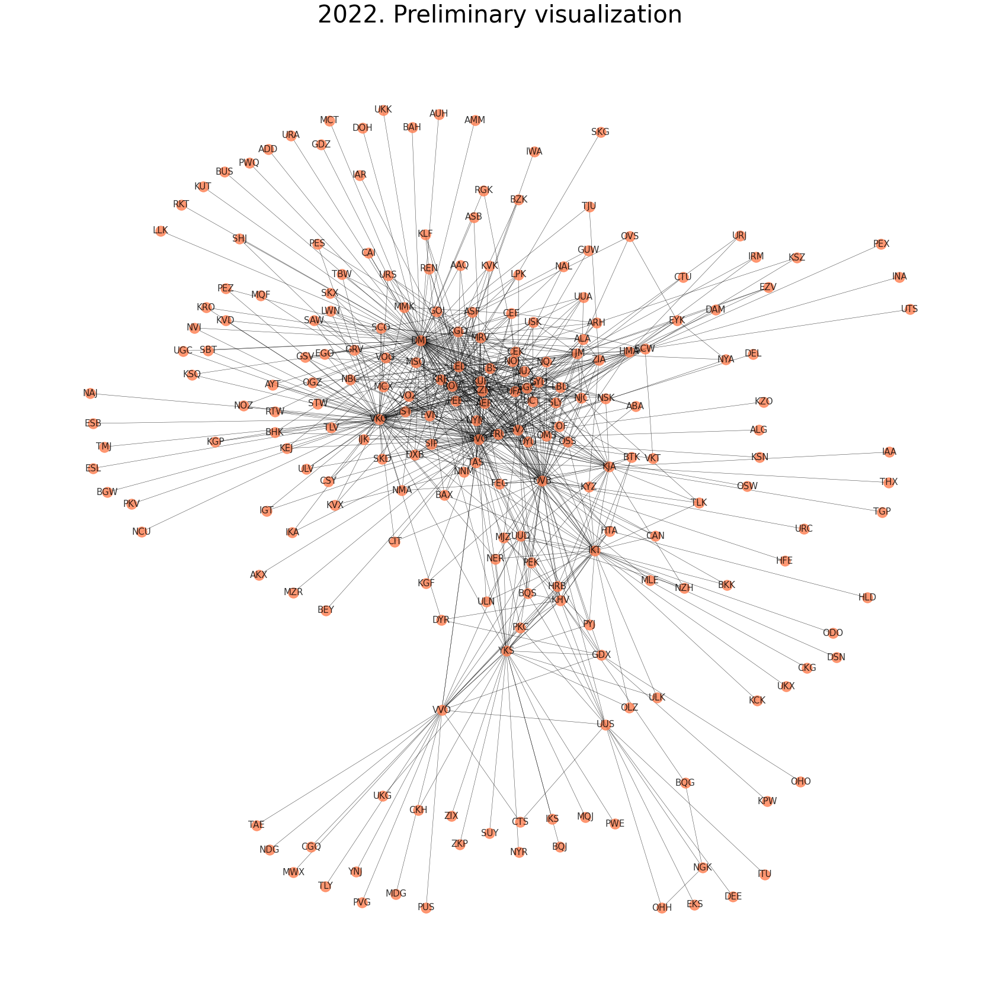

In [16]:
# preliminary network 2022 visualization

fig, ax = plt.subplots(1, 1, figsize=(30, 30), facecolor='w')
ax.set_title('2022. Preliminary visualization', fontsize=40)
nx.draw_networkx(graph_2022, ax=ax,
                 font_size=15, 
                 node_color = 'coral',
                 alpha=.8,
                 width=.5)
ax.set_axis_off()

**For better visual representation of the network, we now put it on a geographic map.**

In [17]:
# the node sizes will depend on the degree of the nodes, that is, the number of connections to every node:
deg_2022 = nx.degree(graph_2022)
sizes_2022 = [5 * deg_2022[iata] for iata in graph_2022.nodes]

# the labels will be displayed for the largest airports only (at least 10 connections to other airports):
labels_2022 = {iata: iata if deg_2022[iata] >= 10 else ''
          for iata in graph_2022.nodes}

In [18]:
# preparing the dictionary of airorts coordinates

coordinates_dict_2022 = dict()

for node in graph_2022.nodes:
    for i in range(len(df_airports_coordinates)):
        if node == df_airports_coordinates['iata_code'][i]:
            coordinates_dict_2022[node]=(df_airports_coordinates['longitude_deg'][i], df_airports_coordinates['latitude_deg'][i])

# adding coordinates of the airports that were missing in the initial dataframe but needed for the analysis
coordinates_dict_2022['RTW'] = (46,51)                        
coordinates_dict_2022

{'IKT': (104.389, 52.268002),
 'BTK': (101.697998, 56.37060165),
 'HTA': (113.306, 52.026299),
 'KCK': (108.064, 57.773),
 'MJZ': (114.0390015, 62.53469849),
 'ODO': (114.2429962, 57.86610031),
 'OVB': (82.618675, 55.019756),
 'TLK': (111.044444, 59.876389),
 'UKX': (105.7300034, 56.8567009),
 'ULK': (114.8259964, 60.72060013),
 'YKS': (129.7709961, 62.09329987),
 'KJA': (92.492437, 56.173077),
 'TOF': (85.20829773, 56.38029861),
 'UFA': (55.87440109, 54.55749893),
 'SGC': (73.40180206, 61.34370041),
 'DME': (37.90629959, 55.40879822),
 'ASF': (48.010511, 46.282843),
 'BHK': (64.483299, 39.775002),
 'FEG': (71.745003, 40.358799),
 'KSQ': (65.773068, 38.802246),
 'NMA': (71.556702, 40.9846),
 'NVI': (65.170799, 40.117199),
 'SKD': (66.9838028, 39.70050049),
 'STW': (42.1128006, 45.10919952),
 'LED': (30.26250076, 59.8003006),
 'CTU': (103.945966, 30.558257),
 'SVO': (37.4146, 55.972599),
 'VKO': (37.26150131, 55.59149933),
 'NUX': (76.52030182, 66.06939697),
 'NYM': (72.69889832, 65.480

In [19]:
# adding attribute 'country' to the nodes

for i, v in df_airports_coordinates.iterrows():                
    for p in list(graph_2022.nodes()):
        if p == v['iata_code']:
            graph_2022.nodes[p]['country'] = v['iso_country']

graph_2022.nodes['RTW']['country'] = 'RU'

In [20]:
# creating color map
color_map = []
for node in graph_2022.nodes():
    if graph_2022.nodes[node]['country'] == 'RU':
        color_map.append('coral')
    else: 
        color_map.append('grey')  

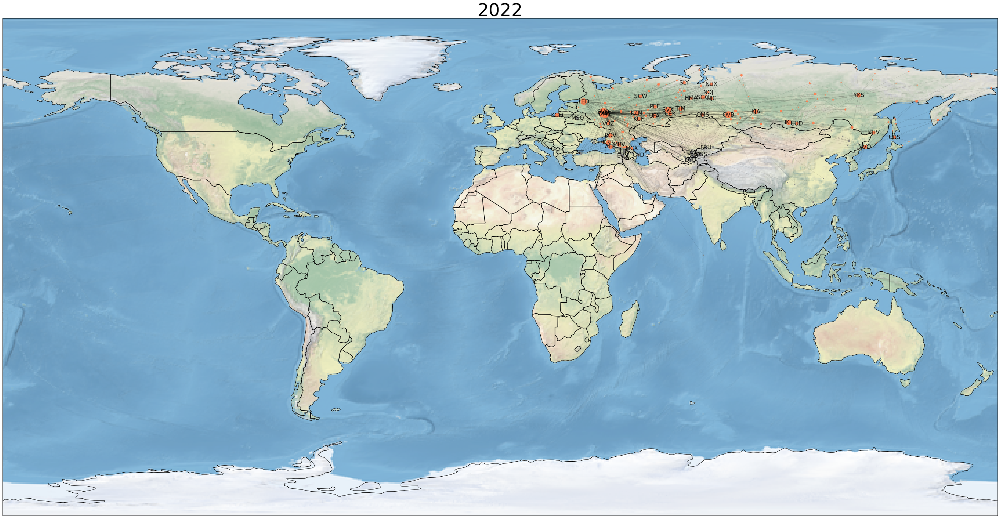

In [21]:
# using cartopy to project the nodes on the geographic map:

# map projection
crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    1, 1, figsize=(50, 30), facecolor='w',
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_title('2022', fontsize=50)
ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black')
ax.stock_img()

# network projection
nx.draw_networkx(graph_2022, ax=ax,
                 font_size=16,
                 alpha=.9,
                 width=.1,
                 node_size=sizes_2022,
                 node_color=color_map,
                 labels=labels_2022,
                 pos=coordinates_dict_2022,
                 )

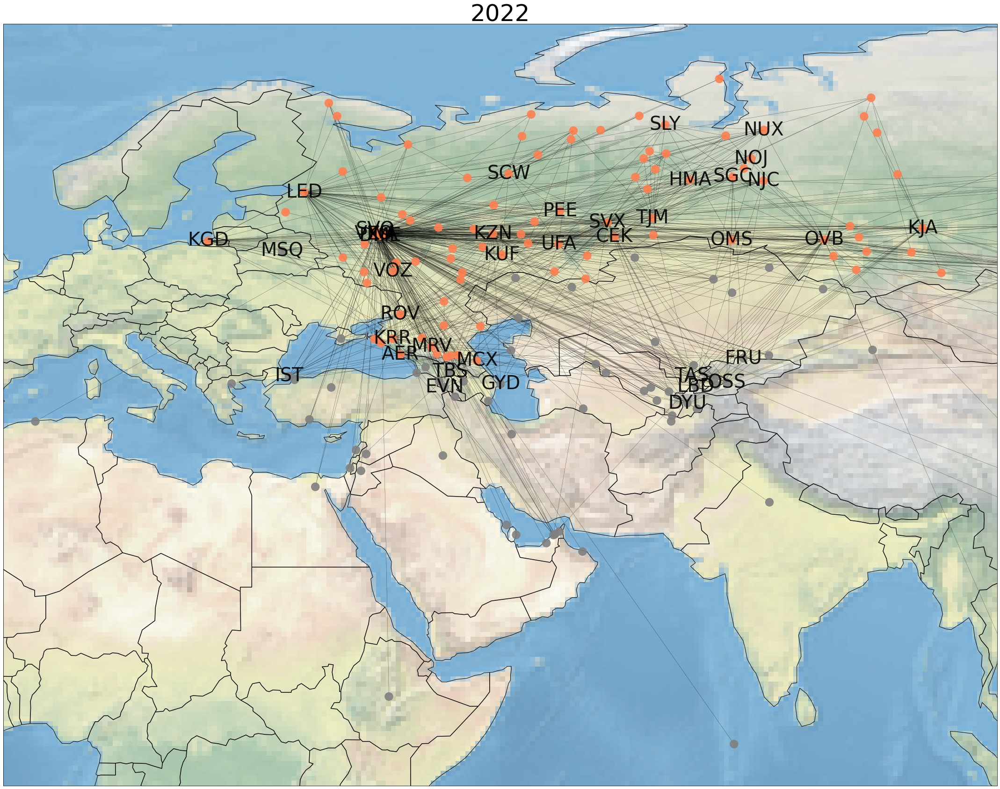

In [22]:
# zooming the map

crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    1, 1, figsize=(50, 30), facecolor='w',
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_title('2022', fontsize=50)
ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black')
ax.set_extent([100, 0, 0, 70])
ax.stock_img()

nx.draw_networkx(graph_2022, ax=ax,
                 font_size=40,
                 alpha=.9,
                 width=.3,
                 node_color=color_map,
                 labels=labels_2022,
                 pos=coordinates_dict_2022,
                 )

# <p style="text-align: center;">Part 2. Data Analysis</p>


## <p style="text-align: center;">Descriptive statistics</p>

To begin with, I apply descriptive statistics to explore the data more.

In [23]:
import statistics

### <p style="color:green;">Year of 2014</p>

In [24]:
# calculating number of nodes (airports) and edges (flights)
print('Number of all airports in the network 2014:', len(graph_2014.nodes()))
print('Number of all flights in the network 2014:', len(graph_2014.edges()))

Number of all airports in the network 2014: 301
Number of all flights in the network 2014: 877


In [25]:
# calculating proportion of destinations abroad (from Russia to other countries)
russian_nodes_14 = []
for node in list(graph_2014.nodes.data()):
    if node[1]['country'] == 'RU':
        russian_nodes_14.append(node)
        
foreign_destinations_2014 = len(graph_2014.nodes())-len(russian_nodes_14)

prop_foreign_destinations_2014 = (foreign_destinations_2014 / len(graph_2014.nodes()))*100

print('Number of russian airports in the network 2014:', len(russian_nodes_14))
print('Number of foreign airports in the network 2014:', foreign_destinations_2014)
print('Proportion of foreign airports in the network 2014:', round(prop_foreign_destinations_2014,2))


Number of russian airports in the network 2014: 115
Number of foreign airports in the network 2014: 186
Proportion of foreign airports in the network 2014: 61.79


In [26]:
# transport connectivity measure - beta index (N of connections / N of nodes)
# the higher the index, the higher the density of the network
 
beta_2014 = len(graph_2014.edges()) / len(graph_2014.nodes())
print('Transport network connectivity (beta index) 2014:', round(beta_2014, 2))

Transport network connectivity (beta index) 2014: 2.91


### <p style="color:coral;">Year of 2022</p>

In [27]:
# calculating number of nodes (airports) and edges (flights)
print('Number of all airports in the network 2022:', len(graph_2022.nodes()))
print('Number of all flights in the network 2022:', len(graph_2022.edges()))

Number of all airports in the network 2022: 220
Number of all flights in the network 2022: 826


In [28]:
# calculating proportion of destinations abroad 
russian_nodes_22 = []
for node in list(graph_2022.nodes.data()):
    if node[1]['country'] == 'RU':
        russian_nodes_22.append(node)
        
foreign_destinations_2022 = len(graph_2022.nodes())-len(russian_nodes_22)

prop_foreign_destinations_2022 = (foreign_destinations_2022 / len(graph_2022.nodes()))*100

print('Number of russian airports in the network 2022:', len(russian_nodes_22))
print('Number of foreign airports in the network 2022:', foreign_destinations_2022)
print('Proportion of foreign airports in the network 2022:', round(prop_foreign_destinations_2022,2))

Number of russian airports in the network 2022: 136
Number of foreign airports in the network 2022: 84
Proportion of foreign airports in the network 2022: 38.18


In [29]:
# transport connectivity measure - beta index (N of connections / N of nodes)
# the higher the index, the higher the density
 
beta_2022 = len(graph_2022.edges()) / len(graph_2022.nodes())
print('Transport network connectivity (beta index) 2022:', round(beta_2022, 2))

Transport network connectivity (beta index) 2022: 3.75


## <p style="text-align: center;">Degree centrality distribution</p>

Degree centrality shows the number of connections to a node. 

### <p style="color:green;">Year of 2014</p>

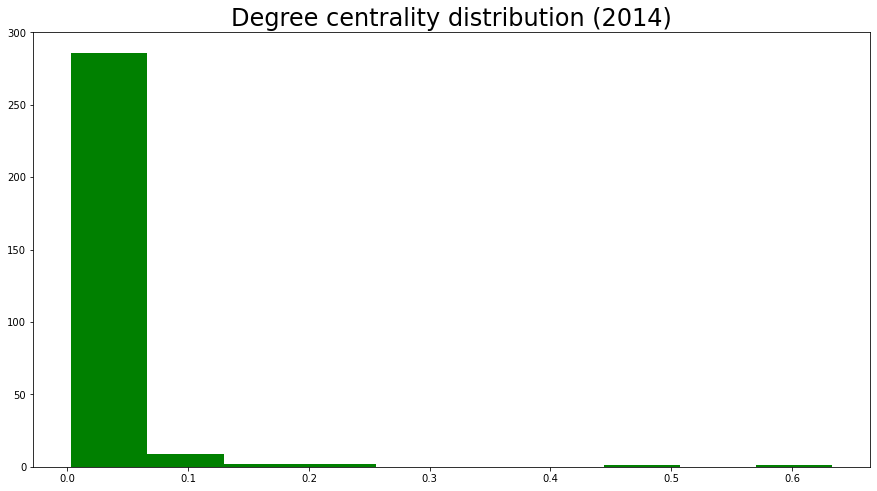

In [30]:
# degree centrality 2014
degree_centrality_2014 = nx.degree_centrality(graph_2014)
dc_2014_dict = dict(sorted(degree_centrality_2014.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(15, 8), facecolor='w')
plt.title('Degree centrality distribution (2014)', fontsize=24)
plt.hist(list(degree_centrality_2014.values()), color='green')
plt.show()

In [31]:
# displaying airports with the highest degree centrality (>= 0.05) in 2014
dc_2014_dict_top = {}

for k,v in dc_2014_dict.items():
    if v >= 0.05:
        dc_2014_dict_top[k] = round(v,2)

list_dc_2014 = []
for k,v in dc_2014_dict_top.items():
    list_dc_2014.append((k, graph_2014.nodes[k]['country'], v))
df_dc_2014 = pd.DataFrame(list_dc_2014, columns=['iata', 'country_code', 'degree_centrality'])
       
print('Airports with the highest (>=0.05) degree centrality in 2014:')
df_dc_2014 

Airports with the highest (>=0.05) degree centrality in 2014:


,iata,country_code,degree_centrality
0,DME,RU,0.63
1,SVO,RU,0.48
2,VKO,RU,0.25
3,SVX,RU,0.22
4,OVB,RU,0.18
5,LED,RU,0.13
6,KRR,RU,0.12
7,KJA,RU,0.10
8,IKT,RU,0.09
9,YKS,RU,0.08


### <p style="color:coral;">Year of 2022</p>

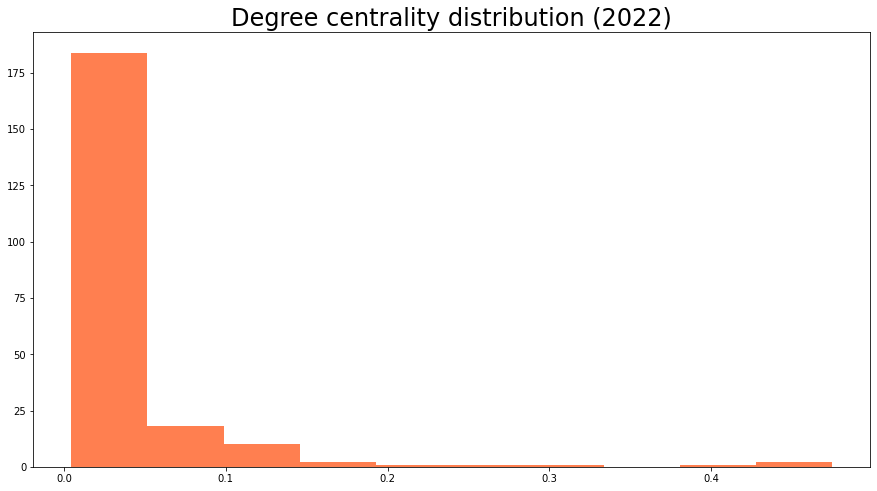

In [32]:
# degree centrality 2022
degree_centrality_2022 = nx.degree_centrality(graph_2022)
dc_2022_dict = dict(sorted(degree_centrality_2022.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(15, 8), facecolor='w')
plt.title('Degree centrality distribution (2022)', fontsize=24)
plt.hist(list(degree_centrality_2022.values()), color = 'coral')
plt.show()

In [33]:
# displaying airports with the highest degree centrality (>= 0.05) in 2022
dc_2022_dict_top = {}

for k,v in dc_2022_dict.items():
    if v >= 0.05:
        dc_2022_dict_top[k] = round(v,2)

list_dc_2022 = []
for k,v in dc_2022_dict_top.items():
    list_dc_2022.append((k, graph_2022.nodes[k]['country'], v))
df_dc_2022 = pd.DataFrame(list_dc_2022, columns=['iata', 'country_code', 'degree_centrality'])
print('Airports with the highest (>=0.05) degree centrality in 2022:')
df_dc_2022

Airports with the highest (>=0.05) degree centrality in 2022:


,iata,country_code,degree_centrality
0,DME,RU,0.47
1,SVO,RU,0.44
2,VKO,RU,0.40
3,OVB,RU,0.30
4,LED,RU,0.27
5,SVX,RU,0.24
6,IKT,RU,0.17
7,KZN,RU,0.17
8,KJA,RU,0.14
9,KRR,RU,0.14


## <p style="text-align: center;">Betweenness centrality distribution</p>

Betweenness centrality shows the extent to which a node lies on paths between other nodes.

### <p style="color:green;">Year of 2014</p>

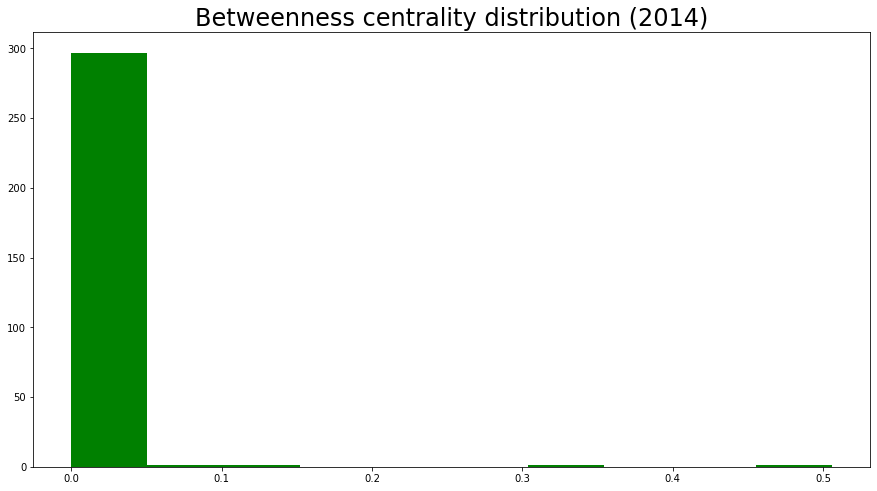

In [34]:
# betweenness centrality 2014
betweenness_centrality_2014 = nx.betweenness_centrality(graph_2014)
bc_2014_dict = dict(sorted(betweenness_centrality_2014.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(15, 8), facecolor='w')
plt.title('Betweenness centrality distribution (2014)', fontsize=24)
plt.hist(list(betweenness_centrality_2014.values()), color = 'green')
plt.show()

In [35]:
# displaying airports with the highest betweenness centrality (>= 0.01) in 2014
bc_2014_dict_top = {}

for k,v in bc_2014_dict.items():
    if v > 0.01:
        bc_2014_dict_top[k] = round(v,2)

list_bc_2014 = []
for k,v in bc_2014_dict_top.items():
    list_bc_2014.append((k, graph_2014.nodes[k]['country'], v))
df_bc_2014 = pd.DataFrame(list_bc_2014, columns=['iata', 'country_code', 'betweenness_centrality'])        
        
print('Airports with the highest (>=0.01) betweenness centrality in 2014:')        
df_bc_2014

Airports with the highest (>=0.01) betweenness centrality in 2014:


,iata,country_code,betweenness_centrality
0,DME,RU,0.51
1,SVO,RU,0.34
2,VKO,RU,0.12
3,SVX,RU,0.06
4,LED,RU,0.04
5,YKS,RU,0.04
6,IKT,RU,0.04
7,UUS,RU,0.03
8,OVB,RU,0.03
9,KJA,RU,0.03


### <p style="color:coral;">Year of 2022</p>

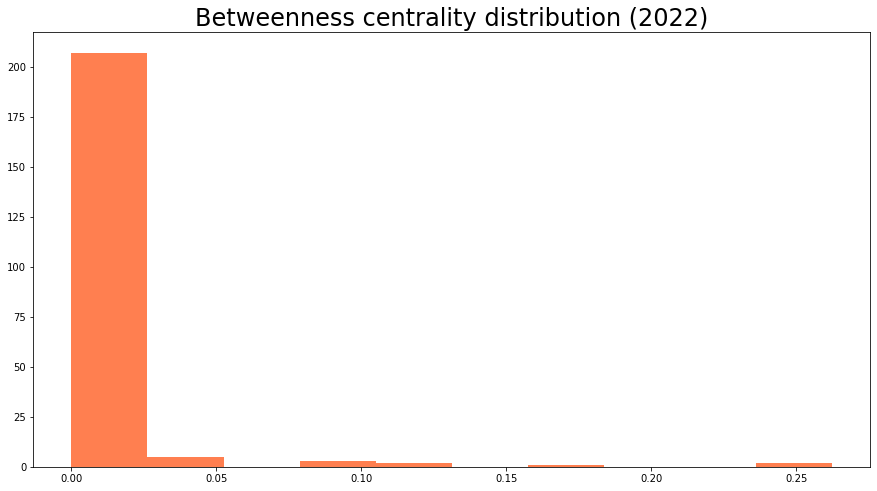

In [36]:
# betweenness centrality 2022
betweenness_centrality_2022 = nx.betweenness_centrality(graph_2022)
bc_2022_dict = dict(sorted(betweenness_centrality_2022.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(15, 8), facecolor='w')
plt.title('Betweenness centrality distribution (2022)', fontsize=24)
plt.hist(list(betweenness_centrality_2022.values()), color = 'coral')
plt.show()

In [37]:
# displaying airports with the highest betweenness centrality (>= 0.01) in 2022
bc_2022_dict_top = {}

for k,v in bc_2022_dict.items():
    if v > 0.01:
        bc_2022_dict_top[k] = round(v,2)

list_bc_2022 = []
for k,v in bc_2022_dict_top.items():
    list_bc_2022.append((k, graph_2022.nodes[k]['country'], v))
df_bc_2022 = pd.DataFrame(list_bc_2022, columns=['iata', 'country_code', 'betweenness_centrality'])    

print('Airports with the highest (>=0.01) betweenness centrality in 2022:')          
df_bc_2022

Airports with the highest (>=0.01) betweenness centrality in 2022:


,iata,country_code,betweenness_centrality
0,SVO,RU,0.26
1,DME,RU,0.26
2,VKO,RU,0.18
3,OVB,RU,0.12
4,YKS,RU,0.11
5,VVO,RU,0.09
6,IKT,RU,0.09
7,LED,RU,0.08
8,UUS,RU,0.05
9,KJA,RU,0.04


## <p style="text-align: center;">Shortest path analysis</p>

Shortest path analysis allows to measure the mean distance from a node to all the other nodes.

### <p style="color:green;">Year of 2014</p>

In [38]:
# average shortest path in 2014
print('Average shortest path in 2014:', round((nx.average_shortest_path_length(graph_2014)), 2))

Average shortest path in 2014: 2.48


In [39]:
# average shortest path per airport in 2014 (closeness centrality)
shortest_path_length_2014 = list(nx.shortest_path_length(graph_2014))

av_shp_dict_2014 = dict()
for tupple in shortest_path_length_2014:
    value = len(graph_2014.nodes()) / sum(list(tupple[1].values()))
    av_shp_dict_2014[tupple[0]] = round(value, 2)
av_shp_dict_2014 = dict(sorted(av_shp_dict_2014.items(), key=lambda item: item[1], reverse=True))

print('Average shortest path per airport in 2014 (closeness centrality):')
av_shp_dict_2014

Average shortest path per airport in 2014 (closeness centrality):


{'DME': 0.64,
 'SVO': 0.57,
 'OVB': 0.54,
 'SVX': 0.54,
 'LED': 0.52,
 'KJA': 0.52,
 'IKT': 0.51,
 'YKS': 0.51,
 'KRR': 0.51,
 'TAS': 0.5,
 'KHV': 0.5,
 'AER': 0.49,
 'MRV': 0.49,
 'KUF': 0.49,
 'EVN': 0.49,
 'VVO': 0.49,
 'GOJ': 0.49,
 'KZN': 0.48,
 'NUX': 0.48,
 'TJM': 0.48,
 'UFA': 0.48,
 'ROV': 0.48,
 'FRA': 0.48,
 'TXL': 0.48,
 'FCO': 0.48,
 'FRU': 0.48,
 'RIX': 0.48,
 'BKK': 0.48,
 'VIE': 0.48,
 'OMS': 0.48,
 'UUD': 0.48,
 'ALA': 0.48,
 'TSE': 0.48,
 'TLV': 0.48,
 'HRG': 0.48,
 'SSH': 0.48,
 'ASF': 0.47,
 'CEK': 0.47,
 'NBC': 0.47,
 'KGD': 0.47,
 'GYD': 0.47,
 'NJC': 0.47,
 'HTA': 0.47,
 'SGC': 0.47,
 'VOG': 0.47,
 'HER': 0.47,
 'DUS': 0.47,
 'MUC': 0.47,
 'HEL': 0.47,
 'MXP': 0.47,
 'MSQ': 0.47,
 'LHR': 0.47,
 'HKG': 0.47,
 'LCA': 0.47,
 'REN': 0.47,
 'DXB': 0.47,
 'UUS': 0.47,
 'AGP': 0.47,
 'MAD': 0.47,
 'ABA': 0.47,
 'PEE': 0.47,
 'KBP': 0.47,
 'ODS': 0.47,
 'SIP': 0.47,
 'TOF': 0.47,
 'VNO': 0.47,
 'VKO': 0.46,
 'ATH': 0.46,
 'SKG': 0.46,
 'DWC': 0.46,
 'NRT': 0.46,
 'AAQ': 

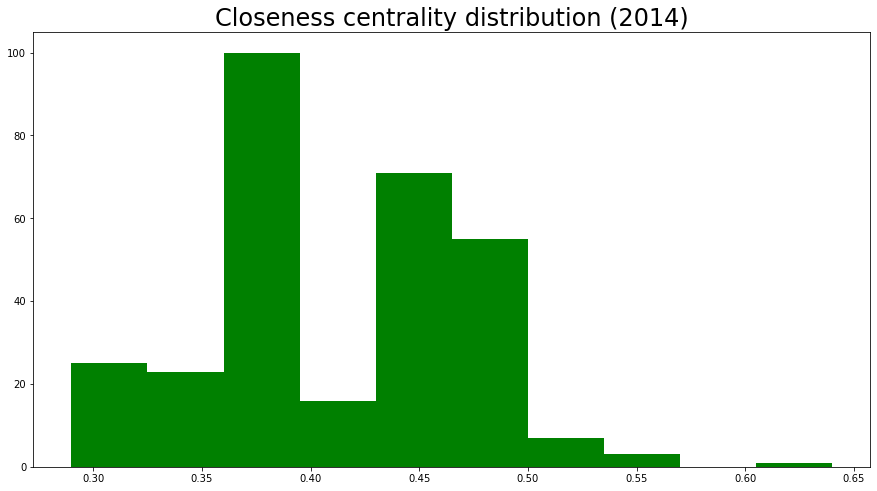

In [40]:
# average shortest paths length distribution 2014
plt.figure(figsize=(15, 8), facecolor='w')
plt.title('Closeness centrality distribution (2014)', fontsize=24)
plt.hist(list(av_shp_dict_2014.values()), color = 'green')
plt.show()

### <p style="color:coral;">Year of 2022</p>

In [41]:
# average shortest path in 2022
print('Average shortest path in 2022:', round((nx.average_shortest_path_length(graph_2022)), 2))

Average shortest path in 2022: 2.55


In [42]:
# average shortest path per airport in 2022 (closeness centrality)
shortest_path_length_2022 = list(nx.shortest_path_length(graph_2022))

av_shp_dict_2022 = dict()
for tupple in shortest_path_length_2022:
    value = len(graph_2022.nodes()) / sum(list(tupple[1].values()))
    av_shp_dict_2022[tupple[0]] = round(value, 2)
av_shp_dict_2022 = dict(sorted(av_shp_dict_2022.items(), key=lambda item: item[1], reverse=True))

print('Average shortest path per airport in 2022 (closeness centrality):')
av_shp_dict_2022

Average shortest path per airport in 2022 (closeness centrality):


{'OVB': 0.59,
 'DME': 0.59,
 'SVO': 0.59,
 'LED': 0.55,
 'VKO': 0.55,
 'IKT': 0.53,
 'SVX': 0.53,
 'YKS': 0.51,
 'KJA': 0.5,
 'UFA': 0.49,
 'TJM': 0.49,
 'KRR': 0.49,
 'KZN': 0.49,
 'SGC': 0.48,
 'AER': 0.48,
 'KGD': 0.48,
 'MRV': 0.48,
 'ROV': 0.48,
 'KUF': 0.48,
 'TAS': 0.48,
 'NUX': 0.47,
 'CEK': 0.47,
 'SCW': 0.47,
 'PEE': 0.47,
 'TOF': 0.46,
 'FEG': 0.46,
 'SIP': 0.46,
 'UUD': 0.46,
 'VOZ': 0.46,
 'VVO': 0.46,
 'EVN': 0.46,
 'OMS': 0.46,
 'FRU': 0.46,
 'TBS': 0.46,
 'MSQ': 0.46,
 'DXB': 0.46,
 'KHV': 0.46,
 'GYD': 0.46,
 'BAX': 0.46,
 'SLY': 0.46,
 'OSS': 0.46,
 'DYU': 0.46,
 'ASF': 0.45,
 'SKD': 0.45,
 'STW': 0.45,
 'NYM': 0.45,
 'GSV': 0.45,
 'MCX': 0.45,
 'MMK': 0.45,
 'OGZ': 0.45,
 'EGO': 0.45,
 'NOJ': 0.45,
 'NBC': 0.45,
 'VOG': 0.45,
 'NQZ': 0.45,
 'NJC': 0.45,
 'HTA': 0.44,
 'MJZ': 0.44,
 'BHK': 0.44,
 'NMA': 0.44,
 'ARH': 0.44,
 'REN': 0.44,
 'GOJ': 0.44,
 'RTW': 0.44,
 'KVK': 0.44,
 'AYT': 0.44,
 'IST': 0.44,
 'KEJ': 0.44,
 'BQS': 0.44,
 'IJK': 0.44,
 'ALA': 0.44,
 'AAQ':

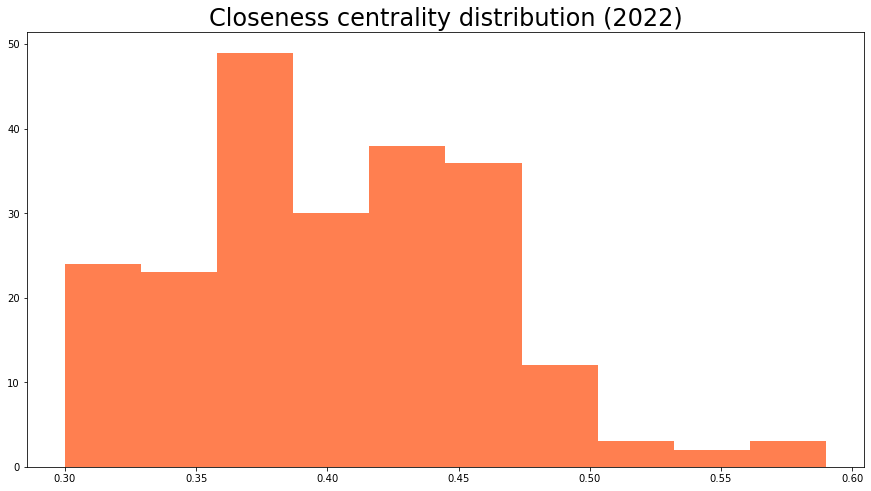

In [43]:
# short paths length distribution 2022
plt.figure(figsize=(15, 8), facecolor='w')
plt.title('Closeness centrality distribution (2022)', fontsize=24)
plt.hist(list(av_shp_dict_2022.values()), color = 'coral')
plt.show()

## <p style="text-align: center;">K-core analysis</p>

K-core is a connected set of nodes where each is joined to at least k of the others. It allows to describe core-periphery structure of a network. 

### <p style="color:green;">Year of 2014</p>

In [44]:
# displaying the K number for each airport in 2014
nx.core_number(graph_2014)

{'AER': 9,
 'KZN': 9,
 'ASF': 5,
 'MRV': 9,
 'CEK': 9,
 'OVB': 9,
 'DME': 9,
 'NBC': 7,
 'TGK': 1,
 'UUA': 3,
 'EGO': 8,
 'KGD': 6,
 'GYD': 8,
 'LED': 9,
 'SVX': 9,
 'NJC': 7,
 'NUX': 9,
 'BTK': 4,
 'IKT': 9,
 'HTA': 6,
 'KCK': 1,
 'ODO': 1,
 'UKX': 1,
 'ULK': 2,
 'YKS': 8,
 'MJZ': 5,
 'BHK': 1,
 'FEG': 4,
 'KSQ': 1,
 'NMA': 7,
 'NVI': 1,
 'SKD': 4,
 'TIV': 1,
 'EYK': 3,
 'VKO': 9,
 'NCU': 2,
 'TJM': 9,
 'UFA': 9,
 'NYM': 6,
 'OVS': 4,
 'UCT': 3,
 'ARH': 3,
 'CSH': 1,
 'MMK': 3,
 'NNM': 3,
 'SVO': 9,
 'USK': 2,
 'SCW': 3,
 'TOS': 1,
 'KRR': 9,
 'PYJ': 4,
 'KJA': 9,
 'RTW': 3,
 'DYU': 9,
 'LBD': 9,
 'SGC': 9,
 'AKX': 1,
 'CSY': 2,
 'ESL': 1,
 'GRV': 1,
 'IJK': 3,
 'MCX': 4,
 'PES': 1,
 'PEZ': 1,
 'SKX': 2,
 'ULV': 2,
 'VKT': 2,
 'VOZ': 6,
 'KUF': 9,
 'ROV': 9,
 'EVN': 9,
 'VOG': 9,
 'IAR': 1,
 'KRO': 2,
 'KVX': 3,
 'MQF': 2,
 'SAW': 5,
 'URJ': 3,
 'AYT': 4,
 'KIV': 3,
 'ATH': 3,
 'CFU': 1,
 'HER': 3,
 'KGS': 1,
 'RHO': 2,
 'SKG': 4,
 'BUS': 1,
 'TBS': 2,
 'KUT': 1,
 'DUS': 3,
 'FRA': 6,

The numbers of k vary for 1 to 9. To draw a k-core network and define core-periphery structure of the network, we have to choose k. Let's take the median value of k = 5 as k-core number. Airports with core number >=5 are the core, the rest are on the periphery of the network.

In [45]:
kcore_subgraph_2014 = nx.k_core(graph_2014, 5)
print('Airports in 5-core network (2014):', list(kcore_subgraph_2014.nodes))

Airports in 5-core network (2014): ['TAS', 'GOJ', 'HTA', 'NYM', 'KUF', 'KZN', 'MRV', 'EVN', 'LBD', 'BQS', 'VOZ', 'FRU', 'BKK', 'HMA', 'MJZ', 'SLY', 'ROV', 'OSS', 'SVX', 'VKO', 'SIP', 'ALA', 'KRR', 'MSQ', 'EGO', 'TJM', 'SVO', 'UFA', 'PEK', 'UUD', 'PRG', 'DME', 'NMA', 'DWC', 'HRB', 'YKS', 'NJC', 'NBC', 'SAW', 'FRA', 'OMS', 'SHJ', 'VOG', 'IKT', 'ASF', 'SGC', 'KHV', 'TLV', 'NUX', 'TSE', 'HKG', 'LED', 'NSK', 'KBP', 'UUS', 'CEK', 'NZH', 'SCO', 'NRT', 'NOJ', 'HRG', 'OVB', 'KGD', 'KJA', 'DXB', 'VIE', 'MUC', 'REN', 'AER', 'VVO', 'IST', 'GYD', 'PEE', 'DYU']


In [46]:
# transforming graph_2014 to represent its 5-core structure

kcore_subgraph_2014_map = graph_2014.copy()
labels = {}
val_map = {}
for node in kcore_subgraph_2014_map.nodes():
    if node in list(kcore_subgraph_2014.nodes):
        val_map[node] = 0
        labels[node]=node
    else:
        labels[node] = ''

values = [val_map.get(node, 1) for node in kcore_subgraph_2014_map.nodes()]


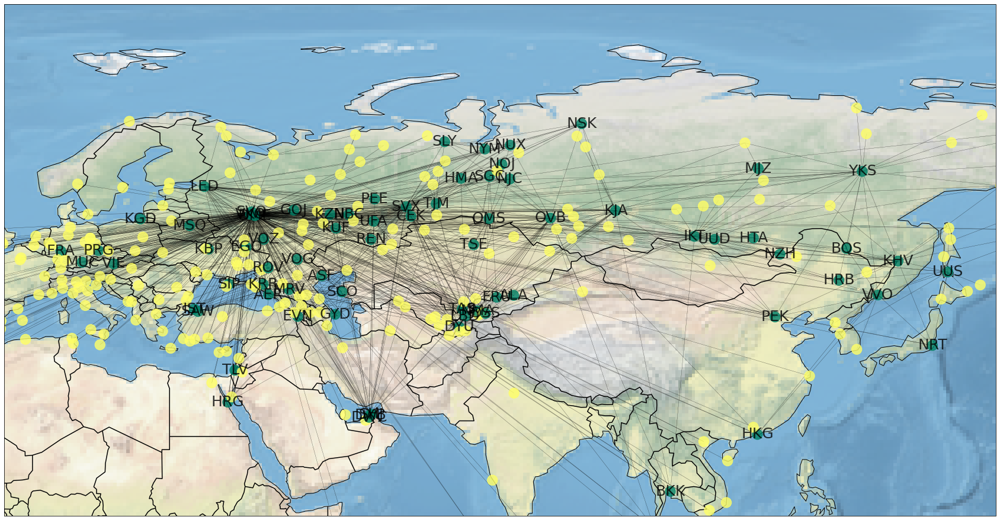

In [47]:
# 5-core 2014 network projection
# green nodes - core (k>=5), yellow nodes - periphery

crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    1, 1, figsize=(30, 30),
    subplot_kw=dict(projection=crs))
ax.coastlines()

ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black')
ax.set_extent([150, 0, 10, 80])
ax.stock_img()

nx.draw_networkx(kcore_subgraph_2014_map, ax=ax,
                 font_size=25,
                 labels=labels,
                 alpha=.8,
                 width=.3,
                 node_color=values,
                 pos=coordinates_dict_2014,
                 cmap=plt.get_cmap('summer'))

### <p style="color:coral;">Year of 2022</p>

In [48]:
# displaying the K number for each airport in 2022
nx.core_number(graph_2022)

{'IKT': 10,
 'BTK': 5,
 'HTA': 7,
 'KCK': 1,
 'MJZ': 6,
 'ODO': 1,
 'OVB': 11,
 'TLK': 4,
 'UKX': 1,
 'ULK': 2,
 'YKS': 7,
 'KJA': 11,
 'TOF': 9,
 'UFA': 11,
 'SGC': 11,
 'DME': 11,
 'ASF': 7,
 'BHK': 3,
 'FEG': 7,
 'KSQ': 2,
 'NMA': 4,
 'NVI': 2,
 'SKD': 5,
 'STW': 4,
 'LED': 11,
 'CTU': 1,
 'SVO': 11,
 'VKO': 11,
 'NUX': 11,
 'NYM': 8,
 'SVX': 11,
 'TJM': 11,
 'ARH': 4,
 'NNM': 3,
 'AER': 11,
 'KGD': 11,
 'KRR': 11,
 'GSV': 4,
 'MCX': 8,
 'MMK': 5,
 'MRV': 11,
 'OGZ': 4,
 'REN': 3,
 'ROV': 11,
 'SIP': 8,
 'UUD': 7,
 'CEK': 11,
 'KUF': 11,
 'KZN': 11,
 'NAL': 2,
 'SCW': 8,
 'VOZ': 10,
 'DAM': 1,
 'PYJ': 4,
 'MWX': 1,
 'VVO': 7,
 'BZK': 2,
 'EGO': 4,
 'LPK': 4,
 'PES': 2,
 'TBW': 3,
 'URS': 4,
 'GOJ': 8,
 'IWA': 1,
 'ULV': 3,
 'EYK': 4,
 'NOJ': 9,
 'ESL': 1,
 'KVX': 3,
 'PEZ': 2,
 'RTW': 3,
 'VKT': 2,
 'KLF': 3,
 'EVN': 10,
 'NBC': 6,
 'OMS': 10,
 'GRV': 6,
 'FRU': 10,
 'VOG': 8,
 'PKV': 1,
 'TBS': 10,
 'ALG': 1,
 'MSQ': 9,
 'PUS': 1,
 'HLD': 1,
 'PEK': 7,
 'URC': 1,
 'CEE': 6,
 'KVK':

The numbers of k vary for 1 to 11. To draw a k-core network and define core-periphery structure of the network, we have to choose k. Let's take the median value of k = 6 as k-core number. Airports with core number >=6 are the core, the rest are on the periphery.

In [49]:
kcore_subgraph_2022 = nx.k_core(graph_2022, 6) 
print('Airports in 6-core network (2022):', list(kcore_subgraph_2022.nodes))

Airports in 6-core network (2022): ['TAS', 'GOJ', 'HTA', 'NYM', 'KUF', 'MRV', 'KZN', 'EVN', 'UUA', 'DYU', 'LBD', 'BQS', 'VOZ', 'FRU', 'HMA', 'MJZ', 'SLY', 'ROV', 'SVX', 'VKO', 'SIP', 'KRR', 'MSQ', 'SVO', 'TJM', 'SCW', 'UFA', 'UUD', 'PEK', 'GYD', 'DME', 'CEE', 'HRB', 'YKS', 'NBC', 'OMS', 'NJC', 'GRV', 'VOG', 'IKT', 'SGC', 'ASF', 'KHV', 'NUX', 'LED', 'NSK', 'USK', 'CEK', 'FEG', 'SCO', 'NOJ', 'OVB', 'KGD', 'KJA', 'DXB', 'ZIA', 'NQZ', 'TBS', 'AER', 'MCX', 'IST', 'TOF', 'VVO', 'PEE', 'OSS']


In [50]:
# transforming graph_2022 to represent its 6-core structure
kcore_subgraph_2022_map = graph_2022.copy()
labels = {}
val_map = {}
for node in kcore_subgraph_2022_map.nodes():
    if node in list(kcore_subgraph_2022.nodes):
        val_map[node] = 1
        labels[node]=node
    else:
        labels[node] = ''

values = [val_map.get(node, 0) for node in kcore_subgraph_2022_map.nodes()]

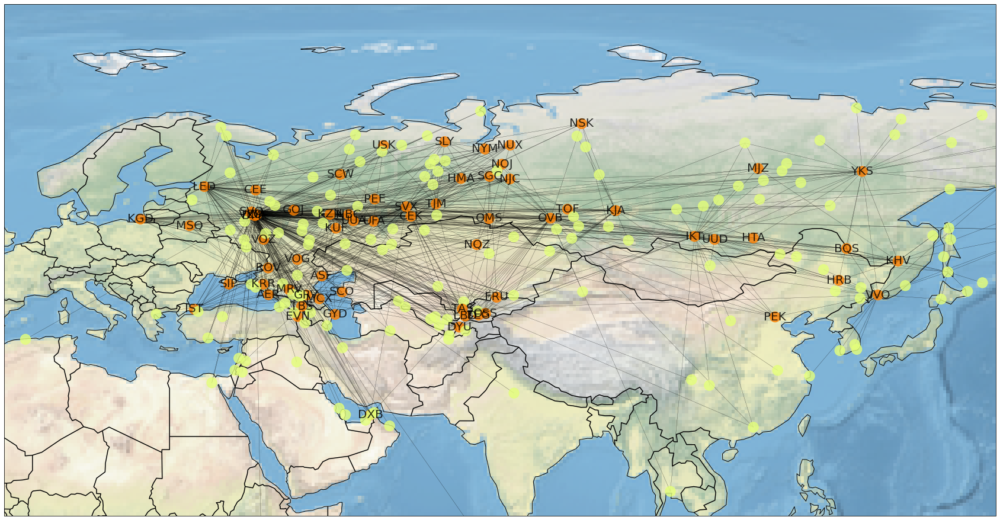

In [51]:
# 6-core 2022 network projection 
# orange nodes - core (k>=6), yellow nodes - periphery

crs = ccrs.PlateCarree()
fig, ax = plt.subplots(
    1, 1, figsize=(30, 30),
    subplot_kw=dict(projection=crs))
ax.coastlines()

ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black')
ax.set_extent([150, 0, 10, 80])
ax.stock_img()

nx.draw_networkx(kcore_subgraph_2022_map, ax=ax,
                 font_size=20,
                 labels=labels,
                 alpha=.8,
                 width=.3,
                 node_color=values,
                 pos=coordinates_dict_2022,
                 cmap=plt.get_cmap('Wistia'))

## <p style="text-align: center;">K-components analysis</p>

K-component is a set of nodes such that each is reachable from each of the others by at least k node-independent paths.

### <p style="color:green;">Year of 2014</p>

In [52]:
k_comp_2014 = nx.k_components(graph_2014) 
k_comp_2014

{9: [{'AER',
   'CEK',
   'DME',
   'DWC',
   'DXB',
   'DYU',
   'EVN',
   'FRU',
   'GOJ',
   'IKT',
   'IST',
   'KJA',
   'KRR',
   'KUF',
   'KZN',
   'LBD',
   'LED',
   'MRV',
   'NSK',
   'OMS',
   'OSS',
   'OVB',
   'PRG',
   'ROV',
   'SGC',
   'SVO',
   'SVX',
   'TAS',
   'TJM',
   'UFA',
   'VKO',
   'VOG'}],
 8: [{'AER',
   'CEK',
   'DME',
   'DWC',
   'DXB',
   'DYU',
   'EGO',
   'EVN',
   'FRU',
   'GOJ',
   'GYD',
   'IKT',
   'IST',
   'KJA',
   'KRR',
   'KUF',
   'KZN',
   'LBD',
   'LED',
   'MRV',
   'NSK',
   'OMS',
   'OSS',
   'OVB',
   'PRG',
   'ROV',
   'SGC',
   'SVO',
   'SVX',
   'TAS',
   'TJM',
   'UFA',
   'VKO',
   'VOG'}],
 7: [{'AER',
   'CEK',
   'DME',
   'DWC',
   'DXB',
   'DYU',
   'EGO',
   'EVN',
   'FRU',
   'GOJ',
   'GYD',
   'HMA',
   'IKT',
   'IST',
   'KHV',
   'KJA',
   'KRR',
   'KUF',
   'KZN',
   'LBD',
   'LED',
   'MRV',
   'NBC',
   'NJC',
   'NMA',
   'NSK',
   'OMS',
   'OSS',
   'OVB',
   'PEK',
   'PRG',
   'ROV',
   'SGC

In [53]:
# Consistent addition of airports to k-component
nine_component_2014 = list(k_comp_2014[9][0])
eight_component_2014 = [item for item in k_comp_2014[8][0] if item not in k_comp_2014[9][0]]
seven_component_2014 = [item for item in k_comp_2014[7][0] if item not in k_comp_2014[8][0]]
six_component_2014 = [item for item in k_comp_2014[6][0] if item not in k_comp_2014[7][0]]
five_component_2014 = [item for item in k_comp_2014[5][0] if item not in k_comp_2014[6][0]]
four_component_2014 = [item for item in k_comp_2014[4][0] if item not in k_comp_2014[5][0]]
three_component_2014 = [item for item in k_comp_2014[3][0] if item not in k_comp_2014[4][0]]
two_component_2014 = [item for item in k_comp_2014[2][0] if item not in k_comp_2014[3][0]]
one_component_2014 = [item for item in k_comp_2014[1][0] if item not in k_comp_2014[2][0]]

print(nine_component_2014)
print(eight_component_2014)
print(seven_component_2014)
print(six_component_2014)
print(five_component_2014)
print(four_component_2014)
print(three_component_2014)
print(two_component_2014)
print(one_component_2014)
print(len(list(k_comp_2014[3][0])))

['TAS', 'GOJ', 'KUF', 'KZN', 'MRV', 'EVN', 'DYU', 'LBD', 'FRU', 'ROV', 'SVX', 'VKO', 'KRR', 'SVO', 'TJM', 'UFA', 'PRG', 'DME', 'DWC', 'OMS', 'VOG', 'IKT', 'SGC', 'LED', 'NSK', 'CEK', 'OVB', 'KJA', 'DXB', 'AER', 'IST', 'OSS']
['EGO', 'GYD']
['HMA', 'PEK', 'UUD', 'NMA', 'NJC', 'YKS', 'NBC', 'KHV', 'TLV', 'VVO']
['NYM', 'VOZ', 'BKK', 'SLY', 'ALA', 'MSQ', 'FRA', 'NUX', 'TSE', 'KBP', 'KGD', 'MUC']
['HTA', 'BQS', 'HRB', 'SAW', 'ASF', 'HKG', 'NZH', 'SCO', 'NOJ', 'REN', 'PEE', 'SIP', 'SHJ', 'UUS', 'HRG', 'VIE']
['AYT', 'PYJ', 'MJZ', 'PKC', 'HKT', 'ICN', 'SSH', 'RIX', 'SKD', 'MCX', 'TOF', 'BTK', 'NER', 'OVS', 'ABA', 'CEE', 'SKG', 'BUD', 'LCA', 'NRT', 'FEG', 'TXL', 'KQT', 'HEL', 'GDX', 'FCO']
['KVX', 'UUA', 'AGP', 'DUS', 'HER', 'NNM', 'URJ', 'RTW', 'ARH', 'MXP', 'MAD', 'AAQ', 'STW', 'NYA', 'IJK', 'KIV', 'EYK', 'VNO', 'ODS', 'SCW', 'MMK', 'LHR', 'PFO', 'CIT', 'ATH']
['DNK', 'IEV', 'TFS', 'HAN', 'ZRH', 'BOJ', 'TBS', 'NCE', 'ULV', 'KEJ', 'DYR', 'NCU', 'MIA', 'SGN', 'GVA', 'MLE', 'BRU', 'MLA', 'KGF'

### <p style="color:coral;">Year of 2022</p>

In [54]:
k_comp_2022 = nx.k_components(graph_2022) 
k_comp_2022

{11: [{'AER',
   'CEK',
   'DME',
   'DYU',
   'KGD',
   'KJA',
   'KRR',
   'KUF',
   'KZN',
   'LBD',
   'LED',
   'MRV',
   'NJC',
   'NUX',
   'OVB',
   'PEE',
   'ROV',
   'SGC',
   'SVO',
   'SVX',
   'TAS',
   'TJM',
   'UFA',
   'VKO'}],
 10: [{'AER',
   'CEK',
   'DME',
   'DYU',
   'EVN',
   'FRU',
   'IKT',
   'IST',
   'KGD',
   'KJA',
   'KRR',
   'KUF',
   'KZN',
   'LBD',
   'LED',
   'MRV',
   'NJC',
   'NUX',
   'OMS',
   'OSS',
   'OVB',
   'PEE',
   'ROV',
   'SGC',
   'SLY',
   'SVO',
   'SVX',
   'TAS',
   'TBS',
   'TJM',
   'UFA',
   'VKO',
   'VOZ'}],
 9: [{'AER',
   'CEK',
   'DME',
   'DYU',
   'EVN',
   'FRU',
   'GYD',
   'IKT',
   'IST',
   'KGD',
   'KJA',
   'KRR',
   'KUF',
   'KZN',
   'LBD',
   'LED',
   'MRV',
   'NJC',
   'NOJ',
   'NQZ',
   'NUX',
   'OMS',
   'OSS',
   'OVB',
   'PEE',
   'ROV',
   'SGC',
   'SLY',
   'SVO',
   'SVX',
   'TAS',
   'TBS',
   'TJM',
   'TOF',
   'UFA',
   'VKO',
   'VOZ'}],
 8: [{'AER',
   'CEK',
   'DME',
   'DXB',


In [55]:
# Consistent addition of airports to k-component
eleven_component_2022 = list(k_comp_2022[11][0])
ten_component_2022 = [item for item in k_comp_2022[10][0] if item not in k_comp_2022[11][0]]
nine_component_2022 = [item for item in k_comp_2022[9][0] if item not in k_comp_2022[10][0]]
eight_component_2022 = [item for item in k_comp_2022[8][0] if item not in k_comp_2022[9][0]]
seven_component_2022 = [item for item in k_comp_2022[7][0] if item not in k_comp_2022[8][0]]
six_component_2022 = [item for item in k_comp_2022[6][0] if item not in k_comp_2022[7][0]]
five_component_2022 = [item for item in k_comp_2022[5][0] if item not in k_comp_2022[6][0]]
four_component_2022 = [item for item in k_comp_2022[4][0] if item not in k_comp_2022[5][0]]
three_component_2022 = [item for item in k_comp_2022[3][0] if item not in k_comp_2022[4][0]]
two_component_2022 = [item for item in k_comp_2022[2][0] if item not in k_comp_2022[3][0]]
one_component_2022 = [item for item in k_comp_2022[1][0] if item not in k_comp_2022[2][0]]

print(eleven_component_2022)
print(ten_component_2022)
print(nine_component_2022)
print(eight_component_2022)
print(seven_component_2022)
print(six_component_2022)
print(five_component_2022)
print(four_component_2022)
print(three_component_2022)
print(two_component_2022)
print(one_component_2022)
print(len(list(k_comp_2022[3][0])))

['TAS', 'KUF', 'MRV', 'KZN', 'LBD', 'ROV', 'SVX', 'VKO', 'KRR', 'SVO', 'TJM', 'UFA', 'DME', 'NJC', 'SGC', 'NUX', 'LED', 'CEK', 'KGD', 'OVB', 'KJA', 'AER', 'PEE', 'DYU']
['EVN', 'VOZ', 'FRU', 'SLY', 'OSS', 'OMS', 'IKT', 'TBS', 'IST']
['NOJ', 'NQZ', 'TOF', 'GYD']
['GOJ', 'NYM', 'SIP', 'MSQ', 'SCW', 'VOG', 'DXB', 'MCX']
['BQS', 'HMA', 'PEK', 'UUD', 'HRB', 'YKS', 'KHV', 'ASF', 'USK', 'FEG', 'ZIA', 'VVO']
['UUA', 'MJZ', 'NBC', 'GRV', 'SCO', 'CEE', 'NSK']
['HTA', 'PKC', 'SAW', 'SKD', 'BTK', 'NER', 'KYZ', 'ALA', 'MMK', 'UUS', 'BAX', 'UCT', 'GDX']
['PYJ', 'LWN', 'EGO', 'OGZ', 'NMA', 'ARH', 'STW', 'TLK', 'IJK', 'EYK', 'ABA', 'URS', 'LPK', 'GSV']
['KVX', 'AYT', 'NNM', 'TLV', 'RTW', 'BHK', 'NZH', 'ULN', 'REN', 'AAQ', 'NYA', 'ULV', 'KEJ', 'DYR', 'OVS', 'TBW', 'EZV', 'KVK', 'CSY', 'KLF', 'CAN', 'CIT']
['IKA', 'IGT', 'KSQ', 'ASB', 'NAL', 'IRM', 'BKK', 'BQG', 'GUW', 'KGF', 'BZK', 'KVD', 'PES', 'NOZ', 'KGP', 'OLZ', 'VKT', 'NGK', 'UGC', 'KSZ', 'CAI', 'KRO', 'CTS', 'SHJ', 'TJU', 'SKX', 'PEZ', 'RGK', 'NV

## <p style="text-align: center;">Clustering</p>

We now compute the average clustering coefficient for the two networks (2014 and 2022). The coefficient measures the likelihood of the neighbours of a node of being neighbours as well. It varies from 0 to 1 where 1 is perfect transitivity, the graph is complete. 

In [56]:
ave_cl_2014 = nx.average_clustering(graph_2014)
print('Average clustering coefficient for the network in 2014:', round(ave_cl_2014, 2))

Average clustering coefficient for the network in 2014: 0.25


In [57]:
ave_cl_2022 = nx.average_clustering(graph_2022)
print('Average clustering coefficient for the network in 2022:', round(ave_cl_2022, 2))

Average clustering coefficient for the network in 2022: 0.37
